In [1]:
import sys
import os
import gc

import nagisa
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm import tqdm, tqdm_notebook

from zelkova import cleaning, normalization
from collections import namedtuple
import MeCab

pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_colwidth', 5000)
pd.options.display.float_format = '{:.3f}'.format
tqdm.pandas()

import show_values_from_table as svt
import reduce_mem_usage as rmu
import category_encoder as ce
import feature_engneering as fe

# 外部モジュールを自動的にリロードする
%load_ext autoreload
%autoreload 2

/Users/takapy/.pyenv/versions/3.7.2/lib/python3.7/site-packages/tqdm/std.py:668: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



# データの読み込み

In [2]:
train = pd.read_csv('../data/raw/train_data.csv', index_col=0)
test = pd.read_csv('../data/raw/test_data.csv', index_col=0)

# EDA

データの俯瞰

In [3]:
display(
    train.head(), train.shape,
    test.head(), test.shape
)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y
id,,,,,,,,,,,,,,,,
1,GDtyztIThRQ,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,2011-01-09T05:50:33.000Z,UCQaNYC3dNvH8FqrEyK7hTJw,DjangoShiny,20,20.01.02,Inazuma|Eleven|Super|Once|bgm|ost|イナズマイレブン|Kyoui|no|Shinryakusha|sekai|he|chosen|challenge|to|the|world|anime|game|ds|music|soundtrack|background|t-pistonz+kmc|berryz|fire|blizzard|spark|bomber|ogre|rip|endou|endo|mark|goenji|kidou|fubuki|aki|kazemaru|someoka|kabeyama|alien|hiroto|midorikawa|song|themes|battle|ffi,114,0,7,https://i.ytimg.com/vi/GDtyztIThRQ/default.jpg,False,False,~ライオコツト ダンジョン~Inazuma Eleven 3 BGM Complete (Ripped by Tommy),29229
2,m4H9s3GtTlQ,ねごと - メルシールー [Official Music Video],2012-07-23T03:00:09.000Z,UChMWDi-HBm5aS3jyRSaAWUA,ねごと Official Channel,10,20.08.02,ねごと|ネゴト|メルシールー|Re:myend|リマインド|Lightdentity|ライデンティティ|放課後ミッドナイターズ|ナースフル|竹清仁|ループ|シャープ|shrap ♯|蒼山幸子|澤村小夜子|藤咲佑|沙田瑞紀|Hello! Z|ex Negoto,2885,50,111,https://i.ytimg.com/vi/m4H9s3GtTlQ/default.jpg,False,False,http://www.negoto.com/全員平成生まれ、蒼山幸子（Vo＆Key)、沙田瑞紀（G)、藤咲佑（Ba）、澤村小夜子（Dr）からなるオルタナティブでファンタジックなロックを鳴らすガールズ4ピースバンド＜ねごと＞。2011年7月13日リリースの1st Full Album「ex Negoto」より「メルシールー」。孤独になってしまったとき、胸の奥にしまっていた大切なことを思い出せたら、すべてがまぶしく見える、そんな瞬間を描いた歌詞と相成る楽曲はシンセ音がエッセンスとなったライブでも盛り上がり必至のナンバー。,730280
3,z19zYZuLuEU,VF3tb 闇よだれvsちび太 (SEGA),2007-07-26T13:54:09.000Z,UCBdcyoZSt5HBLd_n6we-xIg,siropai,24,20.14.01,VF3|VF4|VF5|ちび太|闇よだれ|chibita|virtuafighter|sega|バーチャ,133,17,14,https://i.ytimg.com/vi/z19zYZuLuEU/default.jpg,False,False,Beat-tribe cup finalhttp://ameblo.jp/siropai/,80667
4,pmcIOsL7s98,free frosty weekend!,2005-05-15T02:38:43.000Z,UC7K5am1UAQEsCRhzXpi9i1g,Jones4Carrie,22,19.22.12,frosty,287,51,173,https://i.ytimg.com/vi/pmcIOsL7s98/default.jpg,False,False,I look so bad but look at me!,34826
5,ZuQgsTcuM-4,トップ・オブ・ザ・ワールド,2007-09-09T09:52:47.000Z,UCTW1um4R-QWa8iIfITGvlZQ,Tatsuya Maruyama,10,20.08.01,ギター|guitar|南澤大介|トップオブザワールド|トップ|オブ|ワールド|カーペンターズ|クラシックギター|ソロギターのしらべ|まるちゃん0208|まるやまたつや,178,6,17,https://i.ytimg.com/vi/ZuQgsTcuM-4/default.jpg,False,False,ソロギターのしらべより「トップオブザワールド」です。クラシックギターで弾いてます。Official Website 【http://maruyama-tatsuya.jimdo.com/】Twitter【https://twitter.com/TatsuyaMaruyama】,172727


(19720, 16)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
id,,,,,,,,,,,,,,,
1,xU8UcB6RbLE,Frightened Rabbit - The Greys,2007-09-26T11:00:07.000Z,UCOQ_j8Qg4-p0lGKBpXYENbg,Fatcat Records,10,20.08.01,Fatcat|Records|Frightened|Rabbit|The|Greys,471,38,61,https://i.ytimg.com/vi/xU8UcB6RbLE/default.jpg,False,False,Director: Fraser CampbellDate:2007Taken from Frightened Rabbits Sings The Greys LP on Fatcat Records.Buy here: http://bit.ly/IvUvy9
2,ENuB3qHCp0s,Eダンスアカデミー『EXダンス体操（EXILEのダンス体操）』,2016-05-27T15:00:00.000Z,UCip8ve30-AoX2y2OtAAmqFA,NHK,24,20.09.02,Ｅダンス|Ｅアカ|EXILE|EXダンス体操|ダンス体操|EX体操|エクササイズ、GENERATIONS|USA|TETSUYA|めちゃくちゃダンス|コンテスト|投稿|ダンス,6797,666,0,https://i.ytimg.com/vi/ENuB3qHCp0s/default.jpg,True,False,EXILEがダンスを楽しく分かりやすくレッスンする「Eダンスアカデミー」毎週金曜日に放送中！テレビを見ながらマネするだけでダンスの基本が身につく「まねっこ！うさっこ！てつやっこ！」や、EXILE USAが考えた番組オリジナルエクササイズ「EXダンス体操」など、一緒に踊って楽しめるコーナーがてんこ盛り！みなさんからの投稿動画も募集中です！番組ではこの「EXダンス体操」の投稿動画を募集中です！NHK「Eダンスアカデミー」から生まれた「EXダンス体操」。EXILE USAが考えた、楽しくダンスをしながら全身を使った運動にもなるダンスエクササイズです！【放送情報】NHK Eテレ（金）午後 6：55～「Eダンスアカデミー」http://nhk.jp/e-dance
3,2eIeMPhXhSQ,『Lover Come Back To Me』 大西由希子×川口千里(Senri Kawaguchi)×岩永真奈×長崎祥子,2012-12-10T08:24:57.000Z,UCZyaEXqC4i3ni68duKOg6JA,atossinternational,10,20.03.02,大西由希子|岩永真奈|川口千里|教則|長崎祥子|ジャズ|ユッコミラー|atossinternational|ライブ|Senri Kawaguchi|DrumSolos|Drummer|Drums|Drumming|Jazz,3371,111,212,https://i.ytimg.com/vi/2eIeMPhXhSQ/default.jpg,False,False,教則DVD『アドリブ・サックス・パーフェクト・マスター』収録の究極のギャルバンによるスタジオライヴ！・メンバー大西由希子川口千里(Senri Kawaguchi)岩永真奈長崎祥子『アドリブ・サックス・パーフェクト・マスター』はろめろ～!!YUCCOこと大西由希子だにゃん☆このDVDでは緊張感を表す音、安堵感を表す音などを巧みに紡いで、作曲とアドリブに色彩豊かなストーリーをもたらす理論を解説するよ！アドリブが吹けるようになると、自分の想い通りに音が出せるからサックスを吹くのがもっともっと楽しくなるんだよ！さぁ、私と一緒にアドリブにチャレンジー!!商品情報をもっと見る→https://www.atoss.jp/atdv-295/Amazonで購入する→https://amzn.to/2rQD8Z4Amazonビデオで視聴する→https://amzn.to/2hkBhVS
4,yXfmnY6QIOc,konnkonn雛たち大きくなりました☆,2012-02-27T05:23:46.000Z,UCyeDXVF4epn-ed3c3ckyhOQ,cpj54293,15,20.02.02,オカメインコひな,508,16,23,https://i.ytimg.com/vi/yXfmnY6QIOc/default.jpg,False,False,オカメインコのひなたち約生後３９日です鳴き声が変わりましたジィージィーの中にピィッ！ピィッ！挿しえさ中は大変
5,dGbHHMKYGkw,"Anouk - Everything, Live cover by RU kiddin me",2007-11-24T15:18:04.000Z,UCnOICsYtfygl--dfI9kclVQ,Vinzarelli,10,20.10.01,Anouk|Everything|live|cover|tribute,0,1,0,https://i.ytimg.com/vi/dGbHHMKYGkw/default.jpg,False,False,Anouk tribute band RU kiddin me covers Everything live at Access 2008


(29582, 15)

## 欠損値のチェック

- 欠損データはほぼない綺麗なデータ

In [4]:
display(
    svt.missing_values(train),
    svt.missing_values(test)
)

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y
Total,0,0,0,0,0,0,0,1,0,0,0,0,0,0,312,0
Percent,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.005,0.000,0.000,0.000,0.000,0.000,0.000,1.582,0.000
Types,object,object,object,object,object,int64,object,object,int64,int64,int64,object,bool,bool,object,int64


,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,478
Percent,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.616
Types,object,object,object,object,object,int64,object,object,int64,int64,int64,object,bool,bool,object


## 値のユニーク値をチェク

- categoryは30%が`10`

In [5]:
display(
    svt.most_frequent_values(train),
    svt.most_frequent_values(test)
)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y
Total,19720,19720,19720,19720,19720,19720,19720,19719,19720,19720,19720,19720,19720,19720,19408,19720
Most frequent item,RP8qywehkkI,Pull Scrapers - Bell 4206D & STX 325 single pull scrapers,2016-05-09T03:00:00.000Z,UC1oPBUWifc0QOOY8DEKhLuQ,avex,10,20.09.02,[none],0,0,0,https://i.ytimg.com/vi/nfnWBvZo50c/default.jpg,False,False,,48
Frequence,1,4,7,424,424,6940,6305,916,1482,2737,3619,1,17597,18397,180,4
Percent from total,0.005,0.020,0.035,2.150,2.150,35.193,31.973,4.645,7.515,13.879,18.352,0.005,89.234,93.291,0.927,0.020


,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
Total,29582,29582,29582,29582,29582,29582,29582,29582,29582,29582,29582,29582,29582,29582,29104
Most frequent item,6Glb_yasigA,niagra,2017-11-02T20:52:41.000Z,UC1oPBUWifc0QOOY8DEKhLuQ,avex,10,20.09.02,[none],0,0,0,https://i.ytimg.com/vi/JVoRm0QCnO4/default.jpg,False,False,
Frequence,1,4,8,649,649,10313,9547,1398,2240,4036,5392,1,26310,27603,241
Percent from total,0.003,0.014,0.027,2.194,2.194,34.862,32.273,4.726,7.572,13.643,18.227,0.003,88.939,93.310,0.828


## 基礎統計量のチェック

- 特に分布が大きく異なることはなさそう

In [6]:
display(
    train.describe(),
    test.describe()
)

,categoryId,likes,dislikes,comment_count,y
count,19720.000,19720.000,19720.000,19720.000,19720.000
mean,15.880,16828.086,854.822,1402.115,3732847.514
std,8.670,140429.417,6863.618,31069.271,31527019.636
min,1.000,0.000,0.000,0.000,2.000
25%,10.000,90.000,4.000,4.000,69380.500
50%,17.000,712.000,34.000,49.000,314916.000
75%,24.000,4960.500,198.000,337.000,1312490.500
max,44.000,7644290.000,391646.000,4121491.000,2142560416.000


,categoryId,likes,dislikes,comment_count
count,29582.000,29582.000,29582.000,29582.000
mean,15.864,14856.582,809.416,1015.539
std,8.671,106769.333,12115.767,6493.995
min,1.000,0.000,0.000,0.000
25%,10.000,99.250,5.000,4.000
50%,17.000,738.500,35.000,51.000
75%,24.000,5028.000,203.000,332.000
max,44.000,7049288.000,1660472.000,493194.000


In [7]:
display(
    train.info(),
    test.info()
)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19720 entries, 1 to 19720
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   video_id           19720 non-null  object
 1   title              19720 non-null  object
 2   publishedAt        19720 non-null  object
 3   channelId          19720 non-null  object
 4   channelTitle       19720 non-null  object
 5   categoryId         19720 non-null  int64 
 6   collection_date    19720 non-null  object
 7   tags               19719 non-null  object
 8   likes              19720 non-null  int64 
 9   dislikes           19720 non-null  int64 
 10  comment_count      19720 non-null  int64 
 11  thumbnail_link     19720 non-null  object
 12  comments_disabled  19720 non-null  bool  
 13  ratings_disabled   19720 non-null  bool  
 14  description        19408 non-null  object
 15  y                  19720 non-null  int64 
dtypes: bool(2), int64(5), object(9)
memory u

None

None

# trainデータをみて、視聴回数と影響の大きそうなデータがあるかチェック

## titleを眺める

In [8]:
train[['title', 'y']]

,title,y
id,,
1,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,29229
2,ねごと - メルシールー [Official Music Video],730280
3,VF3tb 闇よだれvsちび太 (SEGA),80667
4,free frosty weekend!,34826
5,トップ・オブ・ザ・ワールド,172727
...,...,...
19716,博多名物！塩もつ鍋♪ Salt Based Motsu Nabe♪ (Hakata Specialty) 猪或牛内脏锅♪,59108
19717,「千利休」 踊る授業シリーズ 【踊ってみたんすけれども】 エグスプロージョン,7625988
19718,Sleeping Beauty Official Trailer,1484041


## mecabで形態素解析してみる

In [119]:
ENABLE_WORD_CLASS_DEF = ['名詞', '動詞', '形容詞']
BF_WORD_CLASS_DEF = ['動詞']

class MeCabTokenizer(object):

    def __init__(self, sys_dic_path='', user_dic_path=''):
        option = ''
        if sys_dic_path:
            option += ' -d {0}'.format(sys_dic_path)
        if user_dic_path:
            option += ' -u {0}'.format(user_dic_path)
        self._t = MeCab.Tagger(option)

    # 品詞によって原型変換するものとしないものを指定できる
    def wakati_distinguish_part(self, sent, ENABLE_WORD_CLASS=ENABLE_WORD_CLASS_DEF, BF_WORD_CLASS=BF_WORD_CLASS_DEF):
        words = [token.base_form if (token.base_form != '*') & (token.pos in BF_WORD_CLASS) else token.surface
                 for token in self.tokenize(sent, ENABLE_WORD_CLASS)]
        return words

    # 分かち書きした結果の値をそのままreturn
    def wakati(self, sent, ENABLE_WORD_CLASS=ENABLE_WORD_CLASS_DEF):
        words = [token.surface for token in self.tokenize(sent, ENABLE_WORD_CLASS)]
        return words

    # 品詞の制限をせずに分かち書きした結果の値をそのままreturn
    def wakati_part_none(self, sent):
        words = [token.surface for token in self.tokenize_part_none(sent)]
        return words

    # 分かち書きした結果の原型をreturn
    def wakati_baseform(self, sent, ENABLE_WORD_CLASS=ENABLE_WORD_CLASS_DEF):
        words = [token.base_form if token.base_form != '*' else token.surface
                 for token in self.tokenize(sent, ENABLE_WORD_CLASS)]
        return words

    # 品詞の制限をせずに分かち書きした結果の原型をreturn
    def wakati_baseform_part_none(self, sent):
        words = [token.base_form if token.base_form != '*' else token.surface
                 for token in self.tokenize_part_none(sent)]
        return words

    # トークナイザ（品詞の制限あり）
    def tokenize(self, text, ENABLE_WORD_CLASS=ENABLE_WORD_CLASS_DEF):
        self._t.parse('')
        chunks = self._t.parse(text.rstrip()).splitlines()[:-1]  # Skip EOS

        # データを格納するだけのクラス宣言
        # featureのフォーマットは、品詞,品詞細分類1,品詞細分類2,品詞細分類3,活用形,活用型,原形,読み,発音
        token = namedtuple('Token', 'surface, pos, pos_detail1, pos_detail2, pos_detail3, infl_type, infl_form, base_form, reading, phonetic')

        for chunk in chunks:
            if chunk == '':
                continue

            # 特定の品詞のみ抽出する
            if chunk.split('\t')[1].split(',')[0] not in ENABLE_WORD_CLASS:
                continue

            # surfaceには分かち書きした後の単語、featureには素性が設定される
            surface, feature = chunk.split('\t')
            feature = feature.split(',')
            if len(feature) <= 7:  # 読みがない
                feature.extend(['*', '*'])
            yield token(surface, *feature)

    # トークナイザ（品詞の制限なし）
    def tokenize_part_none(self, text):

        self._t.parse('')
        chunks = self._t.parse(text.rstrip()).splitlines()[:-1]  # Skip EOS

        # データを格納するだけのクラス宣言
        # featureのフォーマットは、品詞,品詞細分類1,品詞細分類2,品詞細分類3,活用形,活用型,原形,読み,発音
        token = namedtuple('Token', 'surface, pos, pos_detail1, pos_detail2, pos_detail3, infl_type, infl_form, base_form, reading, phonetic')

        for chunk in chunks:
            if chunk == '':
                continue

            # surfaceには分かち書きした後の単語、featureには素性が設定される
            surface, feature = chunk.split('\t')
            feature = feature.split(',')
            if len(feature) <= 7:  # 読みがない
                continue
            yield token(surface, *feature)

In [144]:
def generate_token_df(df, text_col, enable_word_class, bf_word_class) -> pd.DataFrame:
    """指定されたカラムの分かち書きを行う

    Args:
        df (pd.Dataframe): 対象のDF
        id_col (str): idが設定されているカラム名
        text_col (str): 分かち書き対象のカラム名
        enable_word_class (list of str): 分かち書きの対象とする品詞
        bf_word_class (list of str): 分かち書きの対象とする品詞の中で、原型に変形する品詞

    Returns:
        pd.DataFrame: contentを分かち書きしたDataFrame

    """
    def mecab_tokenize(df) -> pd.DataFrame:
        """トークナイズ処理

        Args:
            df (pd.DataFrame): トークナイズ処理対象のDF

        Returns:
            pd.DataFrame: トークナイズ処理後のDF

        """
        def preprocessing(text) -> list:
            """テキストのトークナイズと正規化を行う

            Args:
                text (str): トークナイズ対象のテキスト

            Returns:
                list (str): トークナイズ後のlist

            """
            mecab_tokenizer = MeCabTokenizer(
                                sys_dic_path='/usr/local/lib/mecab/dic/mecab-ipadic-neologd')
            text = normalization.normalize(text)
            text = cleaning.clean_text(text)
#             token = mecab_tokenizer.wakati_distinguish_part(text, enable_word_class, bf_word_class)
            token = mecab_tokenizer.wakati(text, enable_word_class)
            return token

        df['macab_token'] = df[text_col].progress_map(preprocessing)
        return df

    # 重複を除外
#     df = df[[id_col, text_col]]
#     df = df[~df.duplicated()]

    # トークナイズ
    df = mecab_tokenize(df)
    df = df.reset_index(drop=True)
    return df

In [143]:
title_df = train[['title', 'y']]

In [145]:
# 正規化を実施
# temp['title_after'] = temp['title'].progress_apply(lambda x: normalization.normalize(x))
# temp['title_after'] = temp['title_after'].progress_apply(lambda x: cleaning.clean_text(x))

In [146]:
# temp['nagisa_token'] = temp['title_after'].progress_apply(lambda x: nagisa.tagging(x).words)

In [147]:
title_df = generate_token_df(title_df, 'title', ['動詞', '名詞', '形容詞', '副詞', '助詞', '助動詞', '接続詞', '連体詞', '感動詞'], [])

100%|██████████| 19720/19720 [01:21<00:00, 241.02it/s]
/Users/takapy/.pyenv/versions/3.7.2/lib/python3.7/site-packages/ipykernel_launcher.py:43: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [149]:
title_df.head()

,title,y,macab_token
0,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,29229,"[12, bgm, inazuma, eleven, 3, ライオコツトダンジョン]"
1,ねごと - メルシールー [Official Music Video],730280,"[ねごと, メルシールー, official, music, video]"
2,VF3tb 闇よだれvsちび太 (SEGA),80667,"[vf, 3tb, 闇, よだれ, vs, ちび太, sega]"
3,free frosty weekend!,34826,"[free, frosty, weekend]"
4,トップ・オブ・ザ・ワールド,172727,[トップ・オブ・ザ・ワールド]


In [150]:
# スペースで結合
title_df.loc[:, 'macab_token'] = [' '.join(doc) for doc in title_df['macab_token']]

In [151]:
title_df.head()

,title,y,macab_token
0,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,29229,12 bgm inazuma eleven 3 ライオコツトダンジョン
1,ねごと - メルシールー [Official Music Video],730280,ねごと メルシールー official music video
2,VF3tb 闇よだれvsちび太 (SEGA),80667,vf 3tb 闇 よだれ vs ちび太 sega
3,free frosty weekend!,34826,free frosty weekend
4,トップ・オブ・ザ・ワールド,172727,トップ・オブ・ザ・ワールド


In [155]:
title_df.describe()

,y
count,19720.000
mean,3732847.514
std,31527019.636
min,2.000
25%,69380.500
50%,314916.000
75%,1312490.500
max,2142560416.000


## nlplotで可視化

In [152]:
import nlplot

In [164]:
# クラスタを付与
_cluster = pd.qcut(title_df['y'], 10, labels=False)
title_df['y_cluster'] = _cluster.values

In [175]:
title_df.head()

,title,y,macab_token,y_cluster
0,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,29229,12 bgm inazuma eleven 3 ライオコツトダンジョン,1
1,ねごと - メルシールー [Official Music Video],730280,ねごと メルシールー official music video,6
2,VF3tb 闇よだれvsちび太 (SEGA),80667,vf 3tb 闇 よだれ vs ちび太 sega,2
3,free frosty weekend!,34826,free frosty weekend,1
4,トップ・オブ・ザ・ワールド,172727,トップ・オブ・ザ・ワールド,3


In [167]:
npt_low = nlplot.NLPlot(title_df.query('y_cluster <= 1'), taget_col='macab_token')
npt_height = nlplot.NLPlot(title_df.query('y_cluster >= 9'), taget_col='macab_token')

100%|██████████| 1972/1972 [00:00<00:00, 122423.37it/s]


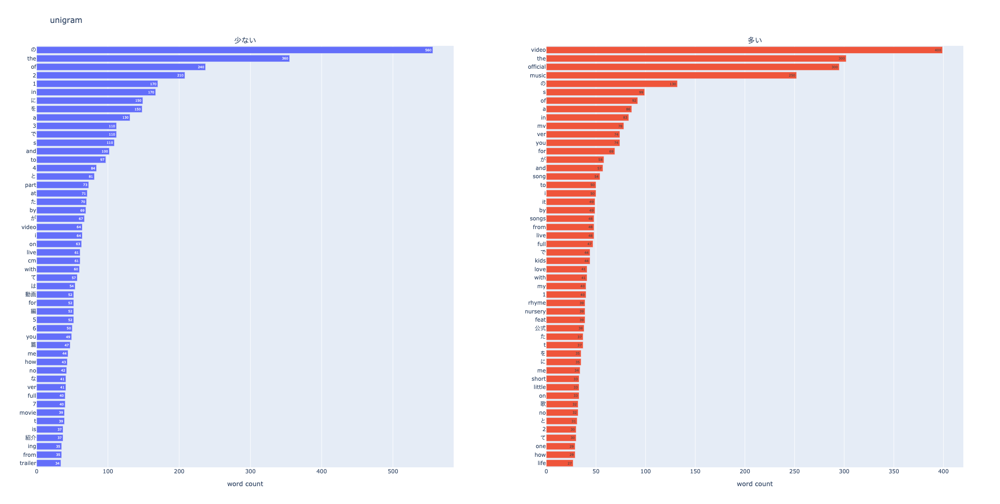

In [169]:
# #データサイエンティストのfigを取得
fig_unigram_low = npt_low.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
)

# #kaggleのfigを取得
fig_unigram_height = npt_height.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
)

# subplot
trace1 = fig_unigram_low['data'][0]
trace2 = fig_unigram_height['data'][0]

fig = make_subplots(rows=1, cols=2, subplot_titles=('少ない', '多い'), shared_xaxes=False)
fig.update_xaxes(title_text='word count', row=1, col=1)
fig.update_xaxes(title_text='word count', row=1, col=2)

fig.update_layout(height=1100, width=1200, title_text='unigram')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)

# plotly.offline.plot(fig, filename='unigram #データサイエンティストvs#kaggle.html', auto_open=False)

fig.show()

100%|██████████| 1972/1972 [00:00<00:00, 110046.00it/s]


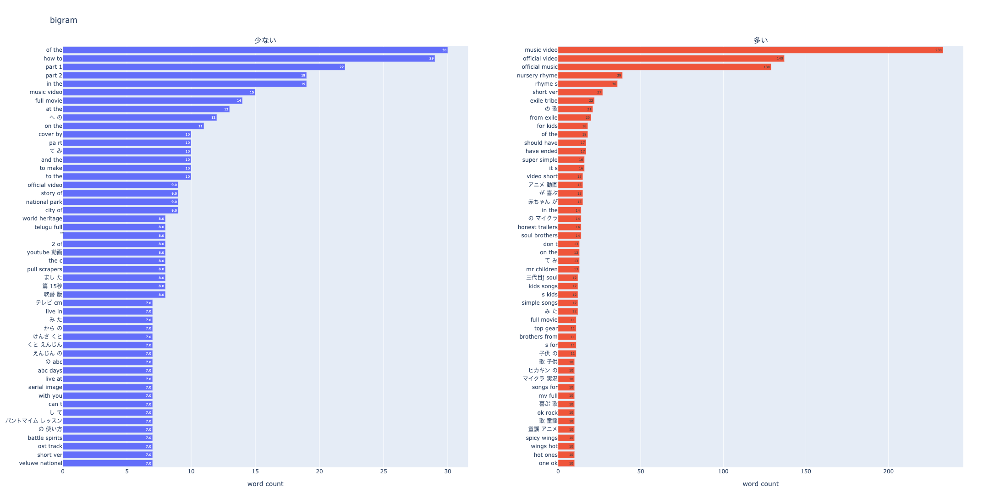

In [170]:
# #データサイエンティストのfigを取得
fig_unigram_low = npt_low.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
)

# #kaggleのfigを取得
fig_unigram_height = npt_height.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
)

# subplot
trace1 = fig_unigram_low['data'][0]
trace2 = fig_unigram_height['data'][0]

fig = make_subplots(rows=1, cols=2, subplot_titles=('少ない', '多い'), shared_xaxes=False)
fig.update_xaxes(title_text='word count', row=1, col=1)
fig.update_xaxes(title_text='word count', row=1, col=2)

fig.update_layout(height=1100, width=1200, title_text='bigram')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)

# plotly.offline.plot(fig, filename='unigram #データサイエンティストvs#kaggle.html', auto_open=False)

fig.show()

100%|██████████| 1972/1972 [00:00<00:00, 111306.25it/s]


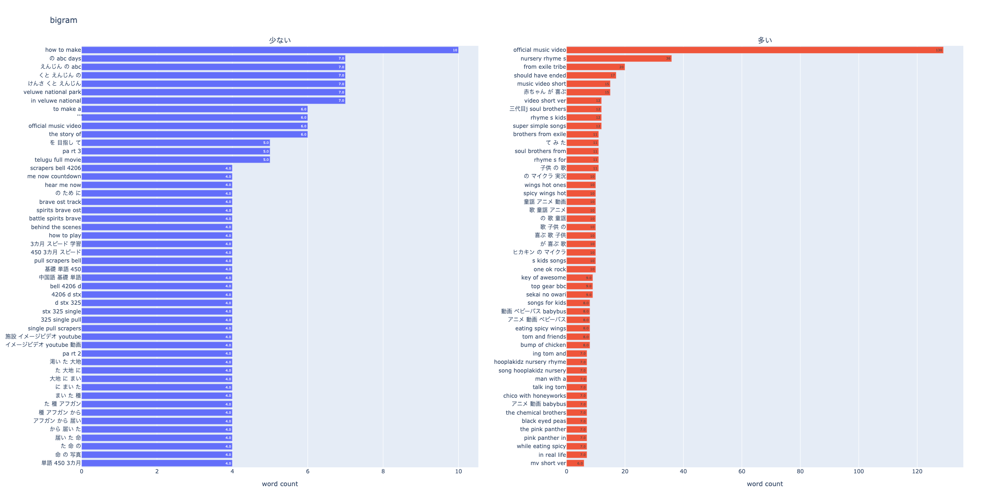

In [172]:
# #データサイエンティストのfigを取得
fig_unigram_low = npt_low.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=3,
    top_n=50,
)

# #kaggleのfigを取得
fig_unigram_height = npt_height.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=3,
    top_n=50,
)

# subplot
trace1 = fig_unigram_low['data'][0]
trace2 = fig_unigram_height['data'][0]

fig = make_subplots(rows=1, cols=2, subplot_titles=('少ない', '多い'), shared_xaxes=False)
fig.update_xaxes(title_text='word count', row=1, col=1)
fig.update_xaxes(title_text='word count', row=1, col=2)

fig.update_layout(height=1100, width=1500, title_text='bigram')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)

# plotly.offline.plot(fig, filename='unigram #データサイエンティストvs#kaggle.html', auto_open=False)

fig.show()

## tf-idfの算出

In [173]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [176]:
title_df

,title,y,macab_token,y_cluster
0,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,29229,12 bgm inazuma eleven 3 ライオコツトダンジョン,1
1,ねごと - メルシールー [Official Music Video],730280,ねごと メルシールー official music video,6
2,VF3tb 闇よだれvsちび太 (SEGA),80667,vf 3tb 闇 よだれ vs ちび太 sega,2
3,free frosty weekend!,34826,free frosty weekend,1
4,トップ・オブ・ザ・ワールド,172727,トップ・オブ・ザ・ワールド,3
...,...,...,...,...
19715,博多名物！塩もつ鍋♪ Salt Based Motsu Nabe♪ (Hakata Specialty) 猪或牛内脏锅♪,59108,博多 名物 塩 もつ鍋 salt based motsu nabe hakata specialty 猪 或 牛内 脏锅,2
19716,「千利休」 踊る授業シリーズ 【踊ってみたんすけれども】 エグスプロージョン,7625988,千利休 踊る 授業 シリーズ 踊ってみた ん す けれども エグスプロージョン,9
19717,Sleeping Beauty Official Trailer,1484041,sleeping beauty official trailer,7
19718,【アニマート動物病院】病院猫スケさんのボールキャッチ！！PART2,125,アニマート 動物病院 病院 猫 スケ さん の ボール キャッチ!! part2,0


In [186]:
df_token = title_df['macab_token'].values.tolist()

In [188]:
df_token[:5]

['12 bgm inazuma eleven 3 ライオコツトダンジョン',
 'ねごと メルシールー official music video',
 'vf 3tb 闇 よだれ vs ちび太 sega',
 'free frosty weekend',
 'トップ・オブ・ザ・ワールド']

In [189]:
tfidf_vec = TfidfVectorizer().fit(df_token)

In [190]:
train_tfidf_vec = tfidf_vec.transform(df_token)

In [191]:
print("X_train_vec\n{}".format(repr(train_tfidf_vec)))

X_train_vec
<19720x37696 sparse matrix of type '<class 'numpy.float64'>'
	with 119462 stored elements in Compressed Sparse Row format>


In [195]:
%%time
# １０次元に圧縮
import umap
um = umap.UMAP(n_components=10, random_state=42)
_umap = um.fit_transform(train_tfidf_vec.toarray())

CPU times: user 5min 24s, sys: 7.78 s, total: 5min 32s
Wall time: 5min 32s


In [196]:
umap_df = pd.DataFrame(_umap, columns=['title_tfidf_umap1', 'title_tfidf_umap2', 'title_tfidf_umap3', 'title_tfidf_umap4', 'title_tfidf_umap5',
                                       'title_tfidf_umap6', 'title_tfidf_umap7', 'title_tfidf_umap8', 'title_tfidf_umap9', 'title_tfidf_umap10'])

In [197]:
umap_df

,title_tfidf_umap1,title_tfidf_umap2,title_tfidf_umap3,title_tfidf_umap4,title_tfidf_umap5,title_tfidf_umap6,title_tfidf_umap7,title_tfidf_umap8,title_tfidf_umap9,title_tfidf_umap10
0,4.230,-2.176,0.227,-1.403,1.912,-2.648,2.974,-0.129,-2.888,2.305
1,4.348,-2.064,0.128,-1.435,2.030,-2.843,3.293,0.170,-2.782,2.272
2,4.276,-2.126,0.181,-1.423,1.976,-2.738,3.116,0.010,-2.846,2.297
3,4.980,-1.635,0.344,-1.573,2.453,-3.342,4.299,1.840,-1.458,1.910
4,4.620,-1.809,0.111,-1.508,2.224,-3.136,3.883,0.916,-2.290,2.109
...,...,...,...,...,...,...,...,...,...,...
19715,5.914,-0.681,0.099,-0.103,0.764,-0.607,0.283,0.465,1.077,0.073
19716,3.848,-2.850,1.110,-1.399,1.308,-1.734,1.798,-1.322,-2.801,2.277
19717,3.853,-2.832,1.083,-1.400,1.326,-1.763,1.827,-1.297,-2.812,2.279
19718,3.865,-2.797,1.030,-1.403,1.361,-1.821,1.886,-1.246,-2.835,2.283


In [198]:
umap_df.to_pickle('../data/features/title_tfidf_umap_10d.pkl')

In [200]:
# dfを結合する
train['type'] = 'train'
test['type'] = 'test'

df = pd.concat([train, test], axis=0, sort=False)

In [212]:
display(
    df.head(),
    df.tail(),
    df.shape
)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek
id,,,,,,,,,,,,,,,,,,,,,,,,,,
1,GDtyztIThRQ,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,2011-01-09 14:50:33+09:00,UCQaNYC3dNvH8FqrEyK7hTJw,DjangoShiny,20,20.01.02,Inazuma|Eleven|Super|Once|bgm|ost|イナズマイレブン|Kyoui|no|Shinryakusha|sekai|he|chosen|challenge|to|the|world|anime|game|ds|music|soundtrack|background|t-pistonz+kmc|berryz|fire|blizzard|spark|bomber|ogre|rip|endou|endo|mark|goenji|kidou|fubuki|aki|kazemaru|someoka|kabeyama|alien|hiroto|midorikawa|song|themes|battle|ffi,114,0,7,https://i.ytimg.com/vi/GDtyztIThRQ/default.jpg,False,False,~ライオコツト ダンジョン~Inazuma Eleven 3 BGM Complete (Ripped by Tommy),29229.000,42,train,0,14,2011,1,1,1,9,6
2,m4H9s3GtTlQ,ねごと - メルシールー [Official Music Video],2012-07-23 12:00:09+09:00,UChMWDi-HBm5aS3jyRSaAWUA,ねごと Official Channel,10,20.08.02,ねごと|ネゴト|メルシールー|Re:myend|リマインド|Lightdentity|ライデンティティ|放課後ミッドナイターズ|ナースフル|竹清仁|ループ|シャープ|shrap ♯|蒼山幸子|澤村小夜子|藤咲佑|沙田瑞紀|Hello! Z|ex Negoto,2885,50,111,https://i.ytimg.com/vi/m4H9s3GtTlQ/default.jpg,False,False,http://www.negoto.com/全員平成生まれ、蒼山幸子（Vo＆Key)、沙田瑞紀（G)、藤咲佑（Ba）、澤村小夜子（Dr）からなるオルタナティブでファンタジックなロックを鳴らすガールズ4ピースバンド＜ねごと＞。2011年7月13日リリースの1st Full Album「ex Negoto」より「メルシールー」。孤独になってしまったとき、胸の奥にしまっていた大切なことを思い出せたら、すべてがまぶしく見える、そんな瞬間を描いた歌詞と相成る楽曲はシンセ音がエッセンスとなったライブでも盛り上がり必至のナンバー。,730280.000,35,train,1,12,2012,3,7,30,23,0
3,z19zYZuLuEU,VF3tb 闇よだれvsちび太 (SEGA),2007-07-26 22:54:09+09:00,UCBdcyoZSt5HBLd_n6we-xIg,siropai,24,20.14.01,VF3|VF4|VF5|ちび太|闇よだれ|chibita|virtuafighter|sega|バーチャ,133,17,14,https://i.ytimg.com/vi/z19zYZuLuEU/default.jpg,False,False,Beat-tribe cup finalhttp://ameblo.jp/siropai/,80667.000,22,train,0,22,2007,3,7,30,26,3
4,pmcIOsL7s98,free frosty weekend!,2005-05-15 11:38:43+09:00,UC7K5am1UAQEsCRhzXpi9i1g,Jones4Carrie,22,19.22.12,frosty,287,51,173,https://i.ytimg.com/vi/pmcIOsL7s98/default.jpg,False,False,I look so bad but look at me!,34826.000,20,train,0,11,2005,2,5,19,15,6
5,ZuQgsTcuM-4,トップ・オブ・ザ・ワールド,2007-09-09 18:52:47+09:00,UCTW1um4R-QWa8iIfITGvlZQ,Tatsuya Maruyama,10,20.08.01,ギター|guitar|南澤大介|トップオブザワールド|トップ|オブ|ワールド|カーペンターズ|クラシックギター|ソロギターのしらべ|まるちゃん0208|まるやまたつや,178,6,17,https://i.ytimg.com/vi/ZuQgsTcuM-4/default.jpg,False,False,ソロギターのしらべより「トップオブザワールド」です。クラシックギターで弾いてます。Official Website 【http://maruyama-tatsuya.jimdo.com/】Twitter【https://twitter.com/TatsuyaMaruyama】,172727.000,13,train,0,18,2007,3,9,36,9,6


,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek
id,,,,,,,,,,,,,,,,,,,,,,,,,,
29578,8_ZeZZbLCRE,♬パパママを助ける！赤ちゃんが泣き止んで喜ぶ歌メドレー | 赤ちゃんが喜ぶ英語の歌 | 子供の歌 | 童謡 | アニメ | 動画 |BabyBus,2017-05-21 18:00:01+09:00,UCwYFFFgr4wl5Oby8gBbAZzg,BabyBus - 子供の歌 - 子どもの動画,27,20.09.02,BabyBus|babybus|子供の歌|童謡アニメ|子供の動画|おもちゃ|panda|パンダ|アンパンマン|アンパンマン歌|ピンクフォン|幼児|子供|ピンキッツ|幼稚園|保育園|ごっこランド|赤ちゃん泣き止む|泣き止み動画|泣き止む音楽|赤ちゃん笑う|赤ちゃんの睡眠音楽|赤ちゃんの睡眠曲|おやすみ用|子守唄|赤ちゃんBGM|いないいないばぁ|子供向け|幼児向け|子供のおもちゃ|赤ちゃん|anpanman|toy|kids|キッズ|こどもちゃれんじ|アニメ|キッチン|子供が夢中|アニメ＆おもちゃ|ごっこ|料理|トイキッズ|ままごと|歌|うた|お店屋さん|ごっこ遊び|キッズライン|キッズスター|マザーグース,1277,757,8,https://i.ytimg.com/vi/8_ZeZZbLCRE/default.jpg,False,False,YouTubeからBabyBus(ベビーバス)のチャンネル登録をすれば、もっと多くの動画が見られます！►►https://goo.gl/UOiJTf—————BabyBus(ベビーバス)は「楽しい気付き」を教育の出発点に置き、子供達に学習への興味を持たせ、幸せな子供時代を過ごさせてあげることに力を注いでいます。6歳以下の幼児を対象に各成長段階に応じた敏感期の特徴と発達状況を考慮し、これをモンテッソーリの教育理念に結び付けました。言語・健康・科学・社会・芸術の5大領域を総合した多量の幼児教育ゲーム、精巧な童謡動画などを研究開発し、「年齢+能力」という多元化されたコンテンツ体系を構築しました。このようして子供達はゲームの中で探索の楽しさを満喫することができます。—————連絡先Eメール：jp@babybus.comホームページ：http：//www.babybus.com #ベビーバス #ベイビーバス #babybus,nan,74,test,0,18,2017,2,5,20,21,6
29579,Ic-hwvqyl1s,レミーのおいしいレストラン Ratatouille Trailer 予告編（Preview),2007-06-30 20:54:11+09:00,UCfQOAn65HJi5XqILyZYdZ-w,BurnandCrop,1,20.07.01,レミーのおいしいレストラン|Ratatouille|Pixar,267,13,30,https://i.ytimg.com/vi/Ic-hwvqyl1s/default.jpg,False,False,This was first shown on remy.jp on June 29th,nan,46,test,0,20,2007,2,6,26,30,5
29580,lzSkw_sQDUw,スタンドアップパドルボード(SUP) ウィロー (TM)| コールマン,2014-07-14 12:39:26+09:00,UC7MRkV4C2hrl9oiPdWe9hWA,コールマン ジャパン 公式,17,20.08.02,sevylor|SUP|Stand|up|paddle|スタンドアップパドルサーフィン|コールマン|coleman|こーるまん|アウトドア|outdoor|キャンプ|camp,7,0,0,https://i.ytimg.com/vi/lzSkw_sQDUw/default.jpg,False,False,これからSUPデビューを飾る人。子どもをボードに乗せてゆったりと楽しみたい人。高い浮力と、安定性に優れたマルチパーパスモデルウィローがオススメです。・ウィロー（ＴＭ）１スタンドアップパドルボードhttp://bit.ly/1oLjJ7D幅広タイプなので 初心者でも乗りやすく 直進性に優れているのでエントリーに最適です。 剛性と安定性に優れたドロップステッチ仕様 ●使用時サイズ：約323×81ｘ10(h)cm●収納時サイズ：約 86×50×26（h）cm 重さ: 約9.3kg付属品：キャリーバッグ/デュアルアクションポンプ/プレッシャーゲージ/リーシュコード ・コールマンオンラインショップhttp://ec.coleman.co.jp/onlineshop/・コールマンウェブサイトhttp://www.coleman.co.jp/・コールマンジャパン公式チャンネルへ登録http://bit.ly/1UmAfqv,nan,35,test,0,12,2014,3,7,29,14,0
29581,SUN1wGXAd3k,ブルーレイ&DVD『LEGO®スクービー・ドゥー：モンスターズ・ハリウッド』7月20日リリース,2016-07-15 16:43:43+09:00,UCSrwpEM8lBM4jR5YoKX3XOQ,ワーナー ブラザース 公式チャンネル,1,20.09.02,[none],136,39,1,https://i.ytimg.com/vi/SUN1wGXAd3k/default.jpg,False,False,NaN,nan,47,test,0,16,2016,3,7,28,15,4
29582,hMO79XWfFJ8,【マインクラフト】アイアンゴーレムトラップ作って鉄を大量ゲットするぞ！【ヒカキンのマイクラ実況 Part241】【ヒカクラ】,2016-09-14 17:51:07+09:00,UCX1xppLvuj03ubLio8jslyA,HikakinGames,20,20.09.02,hikakingames|hikakin|beatbox|game|gameplay|ヒカキン|ヒカキンゲーム|ヒカキンゲームズ|ビートボックス|ボイパ|ゲーム|ゲーム実況|実況プレイ|実況|マインクラフト|マイクラ|minecraft|ヒカクラ|攻略|レシピ|アイアンゴーレムトラップ,26967,3649,3272,https://i.ytimg.com/vi/hMO79XWfFJ8/default.jpg,False,False,◆参考にさせて頂いた動画https://www.youtube.com/watch?v=JIX9VQFTkAM◆チャンネル登録はこちら↓http://www.youtube.com/user/hikakingames?sub_confirmation=1◆日常動画のHikakinTV↓http://www.youtube.com/hikakintv◆ヒカキンLINEスタンプはこちらhttps://store.line.me/stickershop/product/1022677/ja◆ビートボックス動画のHIKAKINチャンネル↓http://www.youtube.com/HIKAKIN◆ラフな動画のHikakinBloghttp://www.youtube.com/hikakinblog◆ツイッター↓http://twitter.com/Hikakin◆ヒカキンLINE公式アカウント●友達登録はこちら↓http://line.naver.jp/ti/p/%40hikakin◆ヒカキンオフィシャルブログ↓http://hikakin.blog.jp/◆ヒカキン公式グッズ↓http://amzn.to/11Pm8eY◆ヒカキンTV動画はこちら↓http://www.youtube.com/hikakintv◆ヒカキンブログ動画はこちら↓http://www.youtube.com/hikakinblog◆ビートボックス動画はこちら↓http://www.youtube.com/HIKAKIN◆ヒカキンのオススメ商品や使用機材↓http://amzn.to/ZW7X6A◆ホームページ↓http://www.hikakintv.com/◆フェイスブック↓http://www.facebook.com/HIKAKIN※上記Amazonリンクはアソシエイトリンクを使用しています。,nan,62,test,0,17,2016,3,9,37,14,2


(49302, 26)

## 可視化

### title

In [202]:
# titleの長さを計算
df['title_len'] = df['title'].apply(lambda x: len(x))

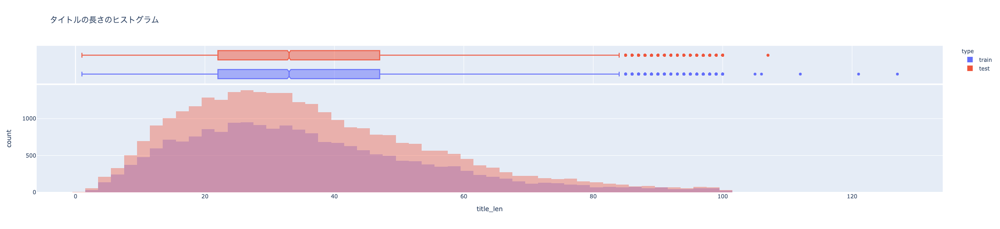

In [203]:
fig = px.histogram(df,
                   x='title_len',
                   color='type', 
                   nbins=100,
                   width=1400,
                   height=500,
                   opacity=0.4,
                   title='タイトルの長さのヒストグラム',
                   marginal='box'
            )
fig.update_layout(barmode='overlay')
fig.show()

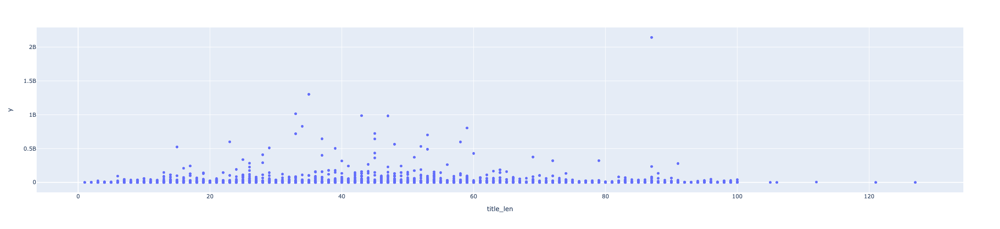

In [204]:
# タイトルの長さと再生回数の関係
fig = px.scatter(df.query('type == "train"'), 
                 x="title_len",
                 y="y",
                 width=1400,
                 height=500)
fig.show()

タイトルの長さと再生回数にはほぼ相関がない

In [205]:
# musicが入っているタイトルはどのくらい？
df['title_in_music'] = df['title'].str.contains('(music|Music)')
df['title_in_music'] = df['title_in_music'] * 1

/Users/takapy/.pyenv/versions/3.7.2/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [206]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music
id,,,,,,,,,,,,,,,,,,,
1,GDtyztIThRQ,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,2011-01-09T05:50:33.000Z,UCQaNYC3dNvH8FqrEyK7hTJw,DjangoShiny,20,20.01.02,Inazuma|Eleven|Super|Once|bgm|ost|イナズマイレブン|Kyoui|no|Shinryakusha|sekai|he|chosen|challenge|to|the|world|anime|game|ds|music|soundtrack|background|t-pistonz+kmc|berryz|fire|blizzard|spark|bomber|ogre|rip|endou|endo|mark|goenji|kidou|fubuki|aki|kazemaru|someoka|kabeyama|alien|hiroto|midorikawa|song|themes|battle|ffi,114,0,7,https://i.ytimg.com/vi/GDtyztIThRQ/default.jpg,False,False,~ライオコツト ダンジョン~Inazuma Eleven 3 BGM Complete (Ripped by Tommy),29229.000,42,train,0
2,m4H9s3GtTlQ,ねごと - メルシールー [Official Music Video],2012-07-23T03:00:09.000Z,UChMWDi-HBm5aS3jyRSaAWUA,ねごと Official Channel,10,20.08.02,ねごと|ネゴト|メルシールー|Re:myend|リマインド|Lightdentity|ライデンティティ|放課後ミッドナイターズ|ナースフル|竹清仁|ループ|シャープ|shrap ♯|蒼山幸子|澤村小夜子|藤咲佑|沙田瑞紀|Hello! Z|ex Negoto,2885,50,111,https://i.ytimg.com/vi/m4H9s3GtTlQ/default.jpg,False,False,http://www.negoto.com/全員平成生まれ、蒼山幸子（Vo＆Key)、沙田瑞紀（G)、藤咲佑（Ba）、澤村小夜子（Dr）からなるオルタナティブでファンタジックなロックを鳴らすガールズ4ピースバンド＜ねごと＞。2011年7月13日リリースの1st Full Album「ex Negoto」より「メルシールー」。孤独になってしまったとき、胸の奥にしまっていた大切なことを思い出せたら、すべてがまぶしく見える、そんな瞬間を描いた歌詞と相成る楽曲はシンセ音がエッセンスとなったライブでも盛り上がり必至のナンバー。,730280.000,35,train,1
3,z19zYZuLuEU,VF3tb 闇よだれvsちび太 (SEGA),2007-07-26T13:54:09.000Z,UCBdcyoZSt5HBLd_n6we-xIg,siropai,24,20.14.01,VF3|VF4|VF5|ちび太|闇よだれ|chibita|virtuafighter|sega|バーチャ,133,17,14,https://i.ytimg.com/vi/z19zYZuLuEU/default.jpg,False,False,Beat-tribe cup finalhttp://ameblo.jp/siropai/,80667.000,22,train,0
4,pmcIOsL7s98,free frosty weekend!,2005-05-15T02:38:43.000Z,UC7K5am1UAQEsCRhzXpi9i1g,Jones4Carrie,22,19.22.12,frosty,287,51,173,https://i.ytimg.com/vi/pmcIOsL7s98/default.jpg,False,False,I look so bad but look at me!,34826.000,20,train,0
5,ZuQgsTcuM-4,トップ・オブ・ザ・ワールド,2007-09-09T09:52:47.000Z,UCTW1um4R-QWa8iIfITGvlZQ,Tatsuya Maruyama,10,20.08.01,ギター|guitar|南澤大介|トップオブザワールド|トップ|オブ|ワールド|カーペンターズ|クラシックギター|ソロギターのしらべ|まるちゃん0208|まるやまたつや,178,6,17,https://i.ytimg.com/vi/ZuQgsTcuM-4/default.jpg,False,False,ソロギターのしらべより「トップオブザワールド」です。クラシックギターで弾いてます。Official Website 【http://maruyama-tatsuya.jimdo.com/】Twitter【https://twitter.com/TatsuyaMaruyama】,172727.000,13,train,0


- musicが含まれている方が再生回数が多い

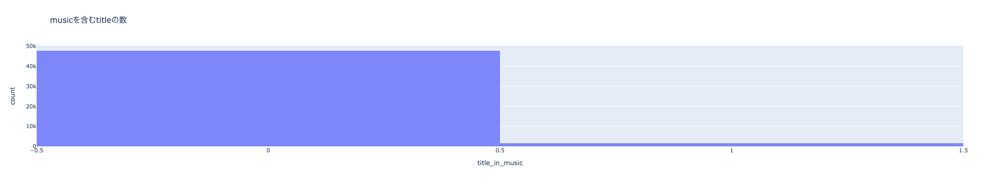

In [207]:
fig = px.histogram(df,
                   x='title_in_music',
#                    nbins=100,
                   width=700,
                   height=400,
                   opacity=0.8,
                   title='musicを含むtitleの数'
            )
fig.update_layout(barmode='overlay')
fig.show()

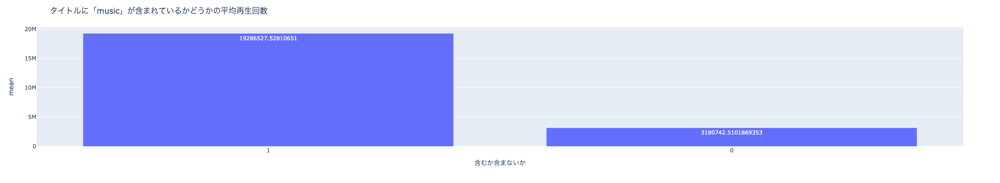

In [208]:
# musicが入っている再生数と、それ以外の再生数の平均を見てみる
_df = df.query('type == "train"').groupby('title_in_music')['y'].mean().reset_index(name='mean').sort_values('mean', ascending=False)
fig = px.bar(_df, y='mean', x='title_in_music', text='mean')
fig.update_layout(
    title='タイトルに「music」が含まれているかどうかの平均再生回数',
    xaxis_title='含むか含まないか',
    width=700,
    height=400,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

- titleに「music」を含む方が再生回数がかなり多い

### publishedAt

In [209]:
def create_time_feature(df, col, prefix):
    attrs = [
        'year',
        'quarter',
        'month',
        'week',
        'day',
        'dayofweek'
    ]
    for attr in attrs:
        dtype = np.int16 if attr == 'year' else np.int8
        df[prefix + '_' + attr] = getattr(df[col].dt, attr).astype(dtype)
        
    return df

In [232]:
# 年、月、日、時間に分割する
df['publishedAt'] = pd.to_datetime(df['publishedAt'], format='%Y-%m-%d %H:%M')
df['publishedAt'] = df['publishedAt'].apply(lambda x: x.tz_convert('Asia/Tokyo')) #日本時間に変更（必要かわからない）
df['published_hour'] = df['publishedAt'].apply(lambda x: (str(x).split()[1]).split(':')[0])
df = create_time_feature(df, 'publishedAt', 'published')

# 土日フラグ
df['published_is_weekend'] = df['published_dayofweek'].isin([5, 6]).astype(np.int8)

In [231]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek,is_weekend
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,GDtyztIThRQ,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,2011-01-09 14:50:33+09:00,1,DjangoShiny,20,2020-02-01,Inazuma|Eleven|Super|Once|bgm|ost|イナズマイレブン|Kyoui|no|Shinryakusha|sekai|he|chosen|challenge|to|the|world|anime|game|ds|music|soundtrack|background|t-pistonz+kmc|berryz|fire|blizzard|spark|bomber|ogre|rip|endou|endo|mark|goenji|kidou|fubuki|aki|kazemaru|someoka|kabeyama|alien|hiroto|midorikawa|song|themes|battle|ffi,114,0,7,https://i.ytimg.com/vi/GDtyztIThRQ/default.jpg,False,False,~ライオコツト ダンジョン~Inazuma Eleven 3 BGM Complete (Ripped by Tommy),29229.000,42,train,0,14,2011,1,1,1,9,6,14,2020-02-01,2020,1,2,5,1,5,1
2,m4H9s3GtTlQ,ねごと - メルシールー [Official Music Video],2012-07-23 12:00:09+09:00,2,ねごと Official Channel,10,2020-02-08,ねごと|ネゴト|メルシールー|Re:myend|リマインド|Lightdentity|ライデンティティ|放課後ミッドナイターズ|ナースフル|竹清仁|ループ|シャープ|shrap ♯|蒼山幸子|澤村小夜子|藤咲佑|沙田瑞紀|Hello! Z|ex Negoto,2885,50,111,https://i.ytimg.com/vi/m4H9s3GtTlQ/default.jpg,False,False,http://www.negoto.com/全員平成生まれ、蒼山幸子（Vo＆Key)、沙田瑞紀（G)、藤咲佑（Ba）、澤村小夜子（Dr）からなるオルタナティブでファンタジックなロックを鳴らすガールズ4ピースバンド＜ねごと＞。2011年7月13日リリースの1st Full Album「ex Negoto」より「メルシールー」。孤独になってしまったとき、胸の奥にしまっていた大切なことを思い出せたら、すべてがまぶしく見える、そんな瞬間を描いた歌詞と相成る楽曲はシンセ音がエッセンスとなったライブでも盛り上がり必至のナンバー。,730280.000,35,train,1,12,2012,3,7,30,23,0,12,2020-02-08,2020,1,2,6,8,5,0
3,z19zYZuLuEU,VF3tb 闇よだれvsちび太 (SEGA),2007-07-26 22:54:09+09:00,3,siropai,24,2020-01-14,VF3|VF4|VF5|ちび太|闇よだれ|chibita|virtuafighter|sega|バーチャ,133,17,14,https://i.ytimg.com/vi/z19zYZuLuEU/default.jpg,False,False,Beat-tribe cup finalhttp://ameblo.jp/siropai/,80667.000,22,train,0,22,2007,3,7,30,26,3,22,2020-01-14,2020,1,1,3,14,1,0
4,pmcIOsL7s98,free frosty weekend!,2005-05-15 11:38:43+09:00,4,Jones4Carrie,22,2019-12-22,frosty,287,51,173,https://i.ytimg.com/vi/pmcIOsL7s98/default.jpg,False,False,I look so bad but look at me!,34826.000,20,train,0,11,2005,2,5,19,15,6,11,2019-12-22,2019,4,12,51,22,6,1
5,ZuQgsTcuM-4,トップ・オブ・ザ・ワールド,2007-09-09 18:52:47+09:00,5,Tatsuya Maruyama,10,2020-01-08,ギター|guitar|南澤大介|トップオブザワールド|トップ|オブ|ワールド|カーペンターズ|クラシックギター|ソロギターのしらべ|まるちゃん0208|まるやまたつや,178,6,17,https://i.ytimg.com/vi/ZuQgsTcuM-4/default.jpg,False,False,ソロギターのしらべより「トップオブザワールド」です。クラシックギターで弾いてます。Official Website 【http://maruyama-tatsuya.jimdo.com/】Twitter【https://twitter.com/TatsuyaMaruyama】,172727.000,13,train,0,18,2007,3,9,36,9,6,18,2020-01-08,2020,1,1,2,8,2,1


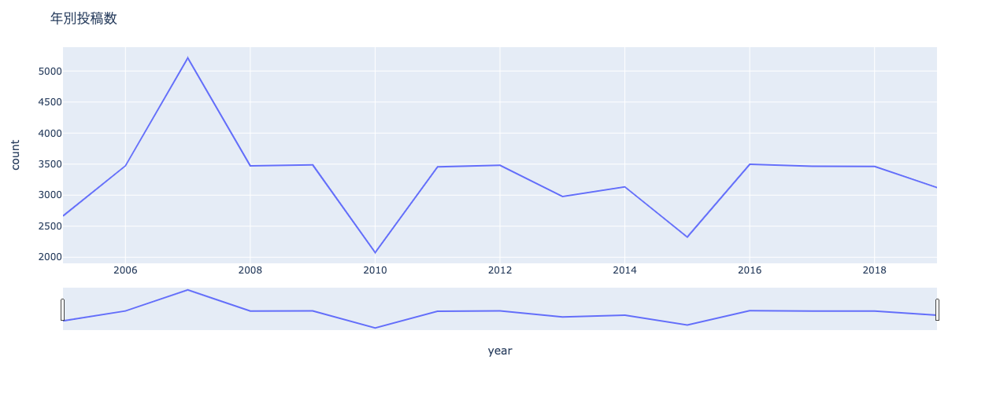

In [214]:
_df = df.groupby('published_year').size().reset_index(name='count')
fig = px.line(_df, x='published_year', y='count')
fig.update_layout(
    title='年別投稿数',
    xaxis_title='year',
    width=1300,
    height=500,
    xaxis_rangeslider_visible=True
)
del _df
fig.show()

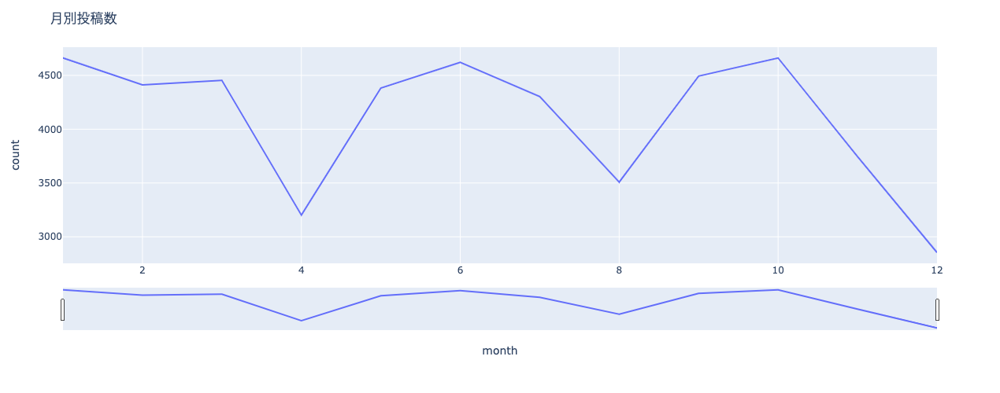

In [215]:
_df = df.groupby('published_month').size().reset_index(name='count')
fig = px.line(_df, x='published_month', y='count')
fig.update_layout(
    title='月別投稿数',
    xaxis_title='month',
    width=1300,
    height=500,
    xaxis_rangeslider_visible=True
)
del _df
fig.show()

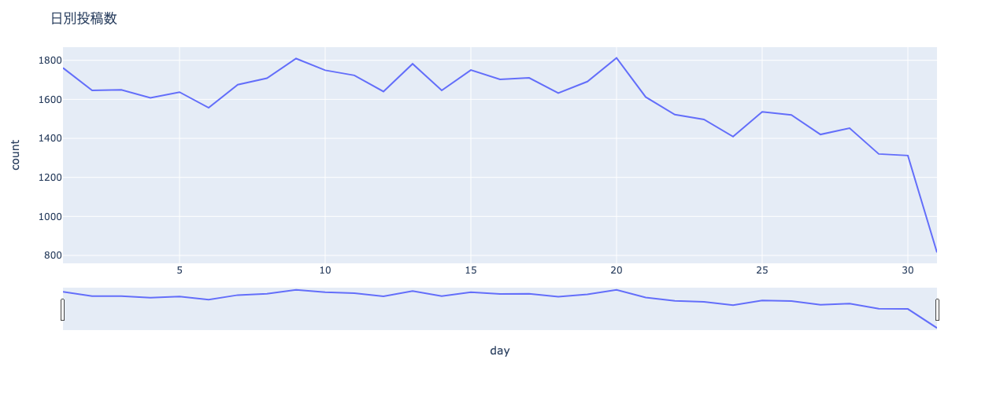

In [216]:
_df = df.groupby('published_day').size().reset_index(name='count')
fig = px.line(_df, x='published_day', y='count')
fig.update_layout(
    title='日別投稿数',
    xaxis_title='day',
    width=1300,
    height=500,
    xaxis_rangeslider_visible=True
)
del _df
fig.show()

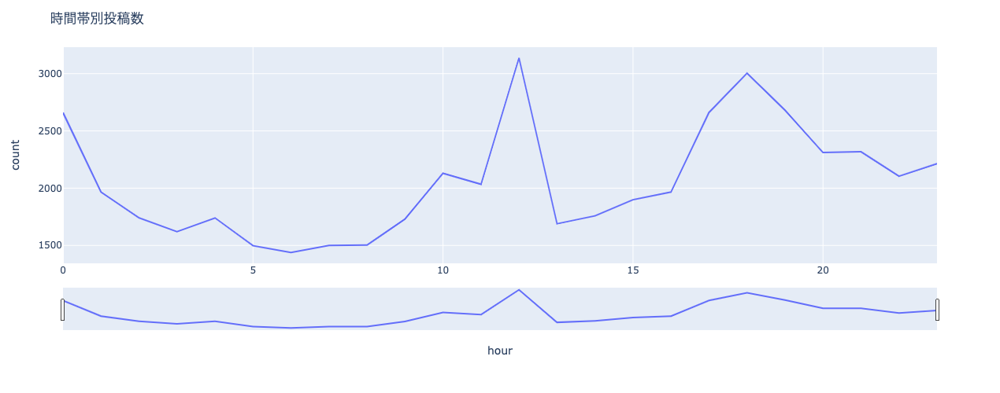

In [220]:
_df = df.groupby('published_hour').size().reset_index(name='count')
fig = px.line(_df, x='published_hour', y='count')
fig.update_layout(
    title='時間帯別投稿数',
    xaxis_title='hour',
    width=1300,
    height=500,
    xaxis_rangeslider_visible=True
)
del _df
fig.show()

### チャンネルID

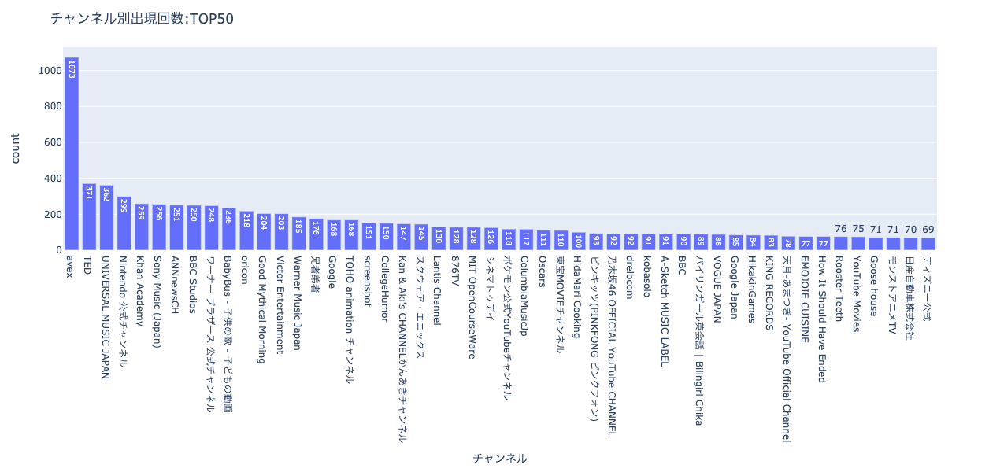

In [221]:
_df = df.groupby('channelTitle').size().reset_index(name='count').sort_values('count', ascending=False).head(50)
fig = px.bar(_df, y='count', x='channelTitle', text='count')
fig.update_layout(
    title='チャンネル別出現回数:TOP50',
    xaxis_title='チャンネル',
    width=1500,
    height=600,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

In [222]:
# チャンネルIDのカテゴリ化
df = ce.ce_ordinal_encoder(df, ['channelId'])

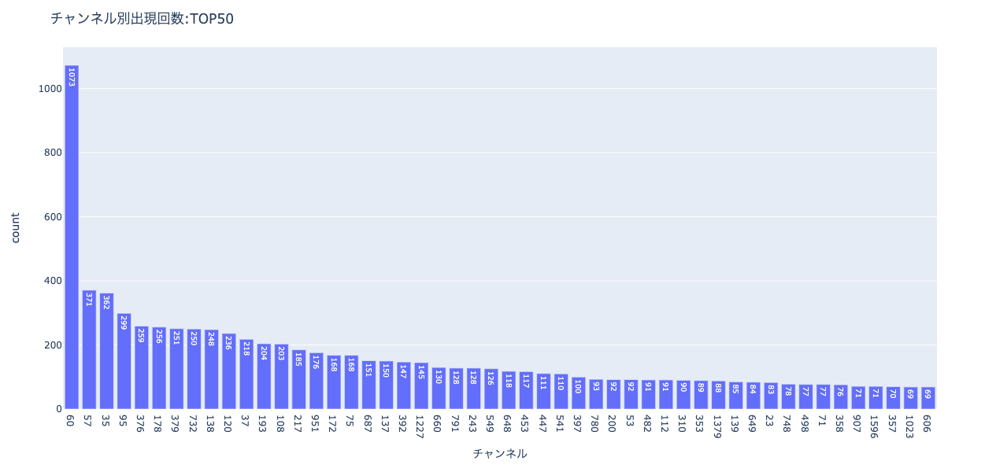

In [223]:
_df = df.groupby('channelId').size().reset_index(name='count').sort_values('count', ascending=False).head(50)
fig = px.bar(_df, y='count', x='channelId', text='count')
fig.update_layout(
    title='チャンネル別出現回数:TOP50',
    xaxis_title='チャンネル',
    width=1500,
    height=600,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

## categoryId

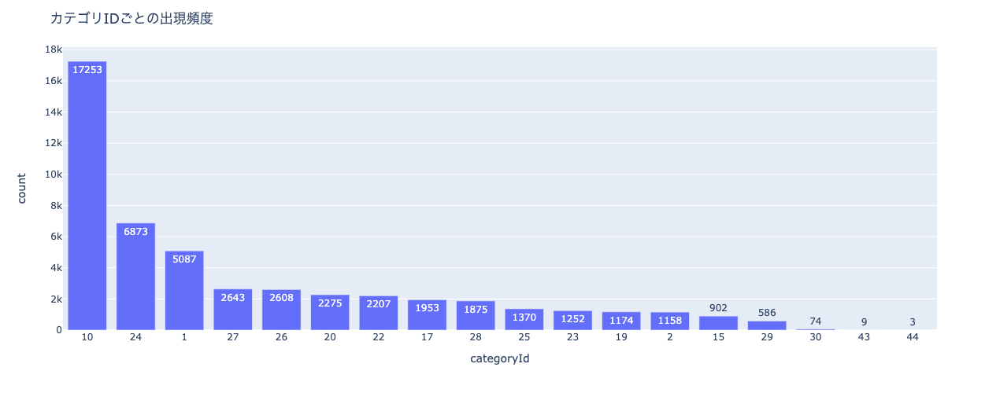

In [224]:
_df = df.groupby('categoryId').size().reset_index(name='count').sort_values('count', ascending=False)
fig = px.bar(_df, y='count', x='categoryId', text='count')
fig.update_layout(
    title='カテゴリIDごとの出現頻度',
    xaxis_title='categoryId',
    width=1300,
    height=500,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

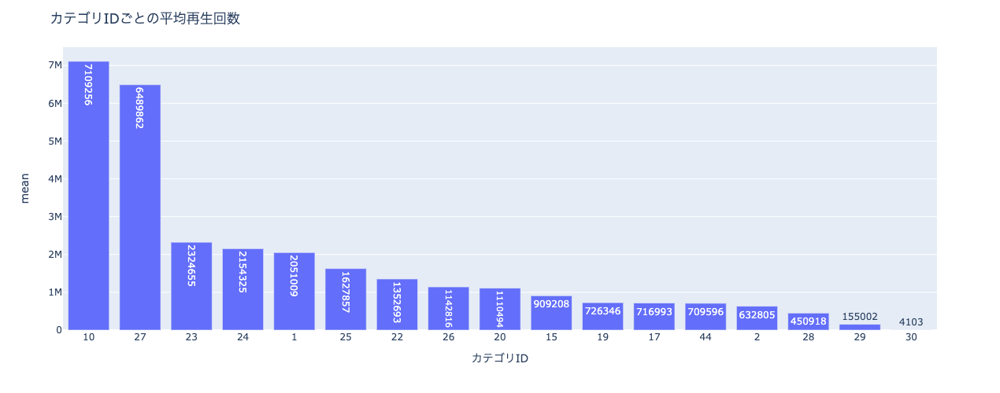

In [225]:
# カテゴリごとの再生回数
_df = df.query('type == "train"').groupby('categoryId')['y'].mean().reset_index(name='mean').sort_values('mean', ascending=False)
_df['mean'] = _df['mean'].apply(lambda x: round(x, 0))
fig = px.bar(_df, y='mean', x='categoryId', text='mean')
fig.update_layout(
    title='カテゴリIDごとの平均再生回数',
    xaxis_title='カテゴリID',
    width=1400,
    height=500,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

## collection_date

In [226]:
def change_to_Date(df):
    df['collection_date'] = df['collection_date'].map(lambda x: x.split('.'))
    df['collection_date'] = df['collection_date'].map(lambda x: '20'+x[0]+'-'+x[2]+'-'+x[1])
    return pd.to_datetime(df['collection_date'], format='%Y-%m-%d')

In [227]:
df['collection_date_after'] = change_to_Date(df)
df = create_time_feature(df, 'collection_date_after', 'collection')

In [228]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,GDtyztIThRQ,[12] BGM Inazuma Eleven 3 - ~ライオコツト ダンジョン~,2011-01-09 14:50:33+09:00,1,DjangoShiny,20,2020-02-01,Inazuma|Eleven|Super|Once|bgm|ost|イナズマイレブン|Kyoui|no|Shinryakusha|sekai|he|chosen|challenge|to|the|world|anime|game|ds|music|soundtrack|background|t-pistonz+kmc|berryz|fire|blizzard|spark|bomber|ogre|rip|endou|endo|mark|goenji|kidou|fubuki|aki|kazemaru|someoka|kabeyama|alien|hiroto|midorikawa|song|themes|battle|ffi,114,0,7,https://i.ytimg.com/vi/GDtyztIThRQ/default.jpg,False,False,~ライオコツト ダンジョン~Inazuma Eleven 3 BGM Complete (Ripped by Tommy),29229.000,42,train,0,14,2011,1,1,1,9,6,14,2020-02-01,2020,1,2,5,1,5
2,m4H9s3GtTlQ,ねごと - メルシールー [Official Music Video],2012-07-23 12:00:09+09:00,2,ねごと Official Channel,10,2020-02-08,ねごと|ネゴト|メルシールー|Re:myend|リマインド|Lightdentity|ライデンティティ|放課後ミッドナイターズ|ナースフル|竹清仁|ループ|シャープ|shrap ♯|蒼山幸子|澤村小夜子|藤咲佑|沙田瑞紀|Hello! Z|ex Negoto,2885,50,111,https://i.ytimg.com/vi/m4H9s3GtTlQ/default.jpg,False,False,http://www.negoto.com/全員平成生まれ、蒼山幸子（Vo＆Key)、沙田瑞紀（G)、藤咲佑（Ba）、澤村小夜子（Dr）からなるオルタナティブでファンタジックなロックを鳴らすガールズ4ピースバンド＜ねごと＞。2011年7月13日リリースの1st Full Album「ex Negoto」より「メルシールー」。孤独になってしまったとき、胸の奥にしまっていた大切なことを思い出せたら、すべてがまぶしく見える、そんな瞬間を描いた歌詞と相成る楽曲はシンセ音がエッセンスとなったライブでも盛り上がり必至のナンバー。,730280.000,35,train,1,12,2012,3,7,30,23,0,12,2020-02-08,2020,1,2,6,8,5
3,z19zYZuLuEU,VF3tb 闇よだれvsちび太 (SEGA),2007-07-26 22:54:09+09:00,3,siropai,24,2020-01-14,VF3|VF4|VF5|ちび太|闇よだれ|chibita|virtuafighter|sega|バーチャ,133,17,14,https://i.ytimg.com/vi/z19zYZuLuEU/default.jpg,False,False,Beat-tribe cup finalhttp://ameblo.jp/siropai/,80667.000,22,train,0,22,2007,3,7,30,26,3,22,2020-01-14,2020,1,1,3,14,1
4,pmcIOsL7s98,free frosty weekend!,2005-05-15 11:38:43+09:00,4,Jones4Carrie,22,2019-12-22,frosty,287,51,173,https://i.ytimg.com/vi/pmcIOsL7s98/default.jpg,False,False,I look so bad but look at me!,34826.000,20,train,0,11,2005,2,5,19,15,6,11,2019-12-22,2019,4,12,51,22,6
5,ZuQgsTcuM-4,トップ・オブ・ザ・ワールド,2007-09-09 18:52:47+09:00,5,Tatsuya Maruyama,10,2020-01-08,ギター|guitar|南澤大介|トップオブザワールド|トップ|オブ|ワールド|カーペンターズ|クラシックギター|ソロギターのしらべ|まるちゃん0208|まるやまたつや,178,6,17,https://i.ytimg.com/vi/ZuQgsTcuM-4/default.jpg,False,False,ソロギターのしらべより「トップオブザワールド」です。クラシックギターで弾いてます。Official Website 【http://maruyama-tatsuya.jimdo.com/】Twitter【https://twitter.com/TatsuyaMaruyama】,172727.000,13,train,0,18,2007,3,9,36,9,6,18,2020-01-08,2020,1,1,2,8,2


### tags

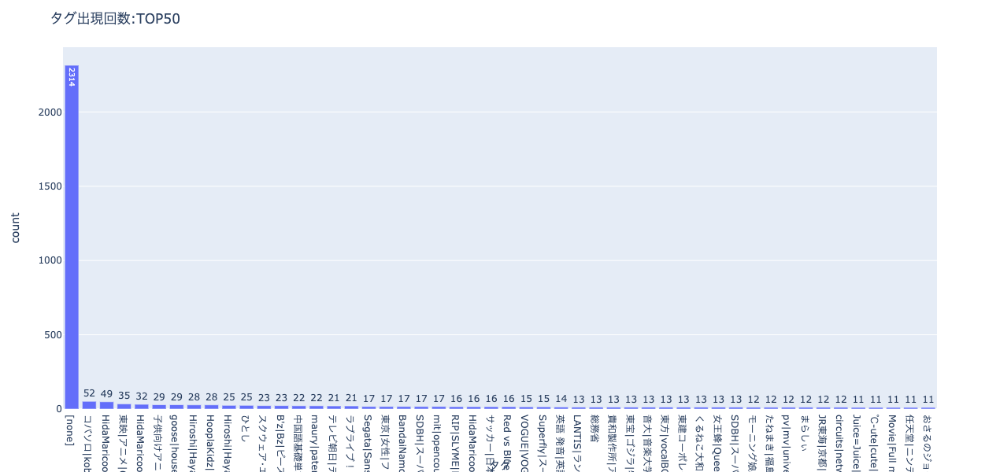

In [243]:
# タグの数
_df = df.groupby('tags').size().reset_index(name='count').sort_values('count', ascending=False).head(50)
fig = px.bar(_df, y='count', x='tags', text='count')
fig.update_layout(
    title='タグ出現回数:TOP50',
    xaxis_title='タグ',
    width=1500,
    height=600,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

[none] というタグが一定数あるので、これを削除する

In [253]:
df['tags_after'] = df['tags'].str.replace('\[none\]', '')
df['tags_after'] = df['tags_after'].replace(r'^\s*$', np.nan, regex=True)

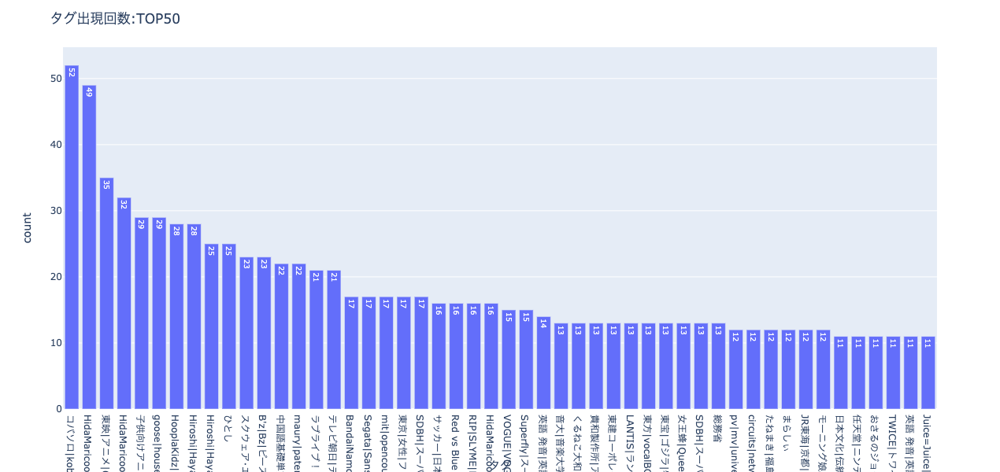

In [254]:
# タグの数
_df = df.groupby('tags_after').size().reset_index(name='count').sort_values('count', ascending=False).head(50)
fig = px.bar(_df, y='count', x='tags_after', text='count')
fig.update_layout(
    title='タグ出現回数:TOP50',
    xaxis_title='タグ',
    width=1500,
    height=600,
    xaxis=dict(type='category') # categoryを指定することで、数値方として判断されなくなる
)
fig.show()

In [262]:
# タグの数をカウント
df['tag_split'] = df['tags_after'].str.split('|')
# 欠損値には99を設定する
df['tag_split'] = df['tag_split'].fillna(99)
df['tag_count'] = df['tag_split'].apply(lambda x: 0 if x==99 else len(x))

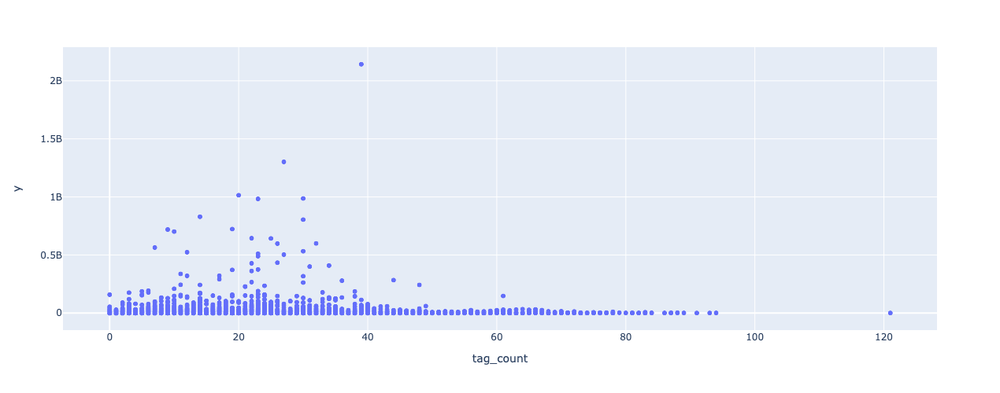

In [265]:
# tag数と再生回数の分布
fig = px.scatter(df.query('type == "train"'), 
                 x="tag_count",
                 y="y",
                 width=1400,
                 height=500)
fig.show()

タグの長さはそこまで関係ないかも

### likes

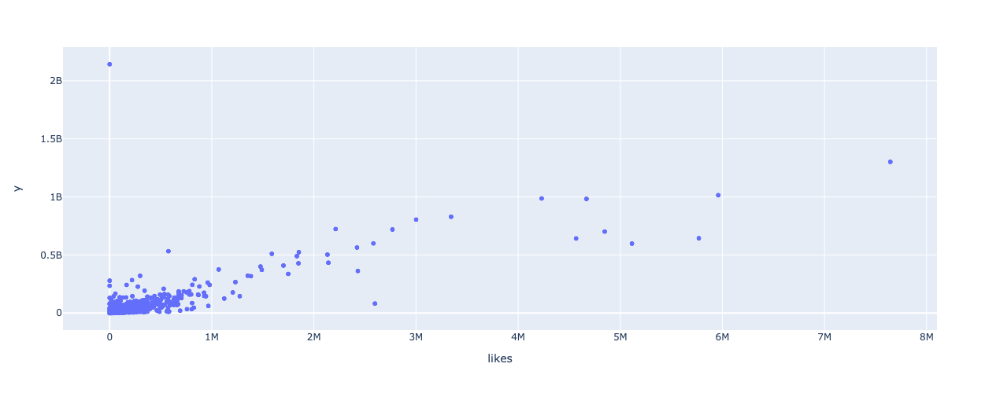

In [266]:
# like数と再生回数の分布
fig = px.scatter(df.query('type == "train"'), 
                 x="likes",
                 y="y",
                 width=1400,
                 height=500)
fig.show()

- 当たり前だが、相関がある
- likesが0で再生回数がTOPのデータがある
  - ratings_disabledがtrueだからだ

In [272]:
# likeは0だが再生回数がTOPのデータ
df.query('type == "train" & likes == 0 & y >= 300_000_000')

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek,is_weekend,published_is_weekend,tags_after,tag_count,tag_split,category_ob
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5181,hq3yfQnllfQ,Phonics Song with TWO Words - A For Apple - ABC Alphabet Songs with Sounds for Children,2014-03-07 05:57:50+09:00,3285,ChuChu TV Nursery Rhymes & Kids Songs,27,2020-02-08,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,0,0,4411,https://i.ytimg.com/vi/hq3yfQnllfQ/default.jpg,False,True,🎧 Listen to ChuChu TV on SPOTIFY - https://ffm.to/eookp7a.oydABC Phonics song. This animated phonics song will help children learn the sounds of the letters in the English alphabet. This colorful phonics song also teaches two words per alphabet letter.Facebook - https://www.facebook.com/chuchutvTwitter - https://twitter.com/TheChuChuTVGoogle+ - https://plus.google.com/u/0/112211188590597855240/posts===============================================Video: Copyright 2017 ChuChu TV® StudiosMusic and Lyrics: Copyright 2017 ChuChu TV® StudiosChuChu TV ® Cutians ® all the characters and logos used are the registered trademarks of ChuChu TV Studios===============================================,2142560416.000,87,train,0,05,2014,1,3,10,7,4,05,2020-02-08,2020,1,2,6,8,5,0,0,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,39,"[phonics, song, phonics song, phonics songs, learn, abc song, abc songs for children, Children's Song, sounds, Animation, Cartoon, Songs, education, preschool, Animated, Song, alphabets, rhymes, nursery rhyme, music, children, chuchutv, Playlist, kids songs, songs for children, kids, music for children, children songs, alphabet songs for children, teach, School, Word, abc phonics song, Alphabet Song, Phonics (TV Subject), ChuChuTV, abcd songs, nursery rhymes, english varnamala]",27


これは除外してもよいかも？

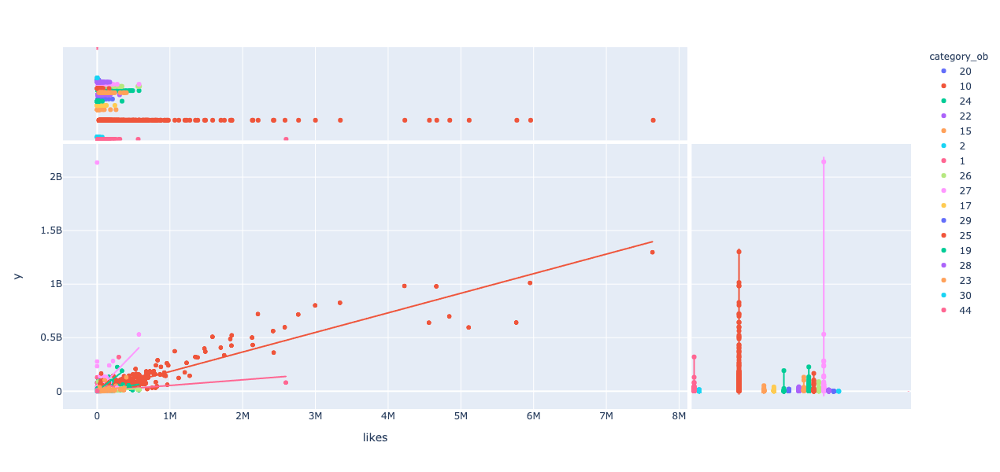

In [269]:
df['category_ob'] = df['categoryId'].astype(str)
fig = px.scatter(
    df.query('type == "train"'), 
    x="likes",
    y="y",
    width=1000,
    height=600,
    color="category_ob",
    marginal_y="violin",
    marginal_x="box",
    trendline="ols")

fig.show()

### dislikes

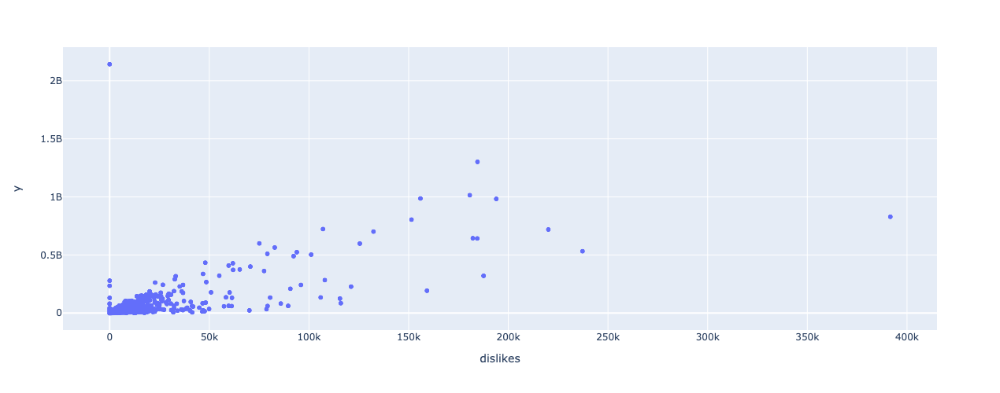

In [270]:
# like数と再生回数の分布
fig = px.scatter(df.query('type == "train"'), 
                 x="dislikes",
                 y="y",
                 width=1100,
                 height=500)
fig.show()

dislikesも正の相関がある

In [273]:
# dislikesは0だが再生回数がTOPのデータ
df.query('type == "train" & dislikes == 0 & y >= 300_000_000')

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek,is_weekend,published_is_weekend,tags_after,tag_count,tag_split,category_ob
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5181,hq3yfQnllfQ,Phonics Song with TWO Words - A For Apple - ABC Alphabet Songs with Sounds for Children,2014-03-07 05:57:50+09:00,3285,ChuChu TV Nursery Rhymes & Kids Songs,27,2020-02-08,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,0,0,4411,https://i.ytimg.com/vi/hq3yfQnllfQ/default.jpg,False,True,🎧 Listen to ChuChu TV on SPOTIFY - https://ffm.to/eookp7a.oydABC Phonics song. This animated phonics song will help children learn the sounds of the letters in the English alphabet. This colorful phonics song also teaches two words per alphabet letter.Facebook - https://www.facebook.com/chuchutvTwitter - https://twitter.com/TheChuChuTVGoogle+ - https://plus.google.com/u/0/112211188590597855240/posts===============================================Video: Copyright 2017 ChuChu TV® StudiosMusic and Lyrics: Copyright 2017 ChuChu TV® StudiosChuChu TV ® Cutians ® all the characters and logos used are the registered trademarks of ChuChu TV Studios===============================================,2142560416.000,87,train,0,05,2014,1,3,10,7,4,05,2020-02-08,2020,1,2,6,8,5,0,0,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,39,"[phonics, song, phonics song, phonics songs, learn, abc song, abc songs for children, Children's Song, sounds, Animation, Cartoon, Songs, education, preschool, Animated, Song, alphabets, rhymes, nursery rhyme, music, children, chuchutv, Playlist, kids songs, songs for children, kids, music for children, children songs, alphabet songs for children, teach, School, Word, abc phonics song, Alphabet Song, Phonics (TV Subject), ChuChuTV, abcd songs, nursery rhymes, english varnamala]",27


### comment_count

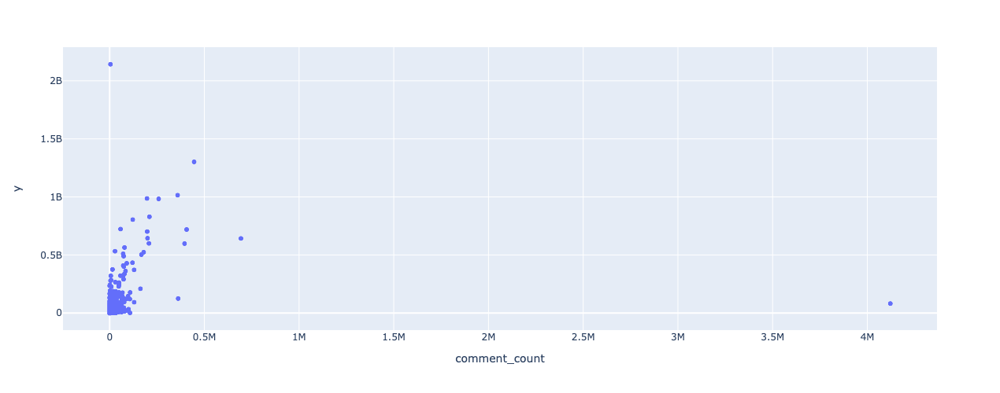

In [274]:
# like数と再生回数の分布
fig = px.scatter(df.query('type == "train"'), 
                 x="comment_count",
                 y="y",
                 width=1100,
                 height=500)
fig.show()

In [276]:
# コメントが少ないけど再生回数が多いやつ
df.query('type == "train" & comment_count <= 5000 & y >= 300_000_000')

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek,is_weekend,published_is_weekend,tags_after,tag_count,tag_split,category_ob
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5181,hq3yfQnllfQ,Phonics Song with TWO Words - A For Apple - ABC Alphabet Songs with Sounds for Children,2014-03-07 05:57:50+09:00,3285,ChuChu TV Nursery Rhymes & Kids Songs,27,2020-02-08,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,0,0,4411,https://i.ytimg.com/vi/hq3yfQnllfQ/default.jpg,False,True,🎧 Listen to ChuChu TV on SPOTIFY - https://ffm.to/eookp7a.oydABC Phonics song. This animated phonics song will help children learn the sounds of the letters in the English alphabet. This colorful phonics song also teaches two words per alphabet letter.Facebook - https://www.facebook.com/chuchutvTwitter - https://twitter.com/TheChuChuTVGoogle+ - https://plus.google.com/u/0/112211188590597855240/posts===============================================Video: Copyright 2017 ChuChu TV® StudiosMusic and Lyrics: Copyright 2017 ChuChu TV® StudiosChuChu TV ® Cutians ® all the characters and logos used are the registered trademarks of ChuChu TV Studios===============================================,2142560416.000,87,train,0,05,2014,1,3,10,7,4,05,2020-02-08,2020,1,2,6,8,5,0,0,phonics|song|phonics song|phonics songs|learn|abc song|abc songs for children|Children's Song|sounds|Animation|Cartoon|Songs|education|preschool|Animated|Song|alphabets|rhymes|nursery rhyme|music|children|chuchutv|Playlist|kids songs|songs for children|kids|music for children|children songs|alphabet songs for children|teach|School|Word|abc phonics song|Alphabet Song|Phonics (TV Subject)|ChuChuTV|abcd songs|nursery rhymes|english varnamala,39,"[phonics, song, phonics song, phonics songs, learn, abc song, abc songs for children, Children's Song, sounds, Animation, Cartoon, Songs, education, preschool, Animated, Song, alphabets, rhymes, nursery rhyme, music, children, chuchutv, Playlist, kids songs, songs for children, kids, music for children, children songs, alphabet songs for children, teach, School, Word, abc phonics song, Alphabet Song, Phonics (TV Subject), ChuChuTV, abcd songs, nursery rhymes, english varnamala]",27


In [277]:
# コメントはめちゃ多いけど再生回数が少ないやつ
# これも除外しても良いかも・・・？
df.query('type == "train" & comment_count >= 4_000_000 & y >= 80_000_000')

,video_id,title,publishedAt,channelId,channelTitle,categoryId,collection_date,tags,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,y,title_len,type,title_in_music,hour_published,published_year,published_quarter,published_month,published_week,published_day,published_dayofweek,published_hour,collection_date_after,collection_year,collection_quarter,collection_month,collection_week,collection_day,collection_dayofweek,is_weekend,published_is_weekend,tags_after,tag_count,tag_split,category_ob
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12129,jNQXAC9IVRw,Me at the zoo,2005-04-24 12:31:52+09:00,6314,jawed,1,2019-12-22,me at the zoo|jawed karim|first youtube video,2597579,85863,4121491,https://i.ytimg.com/vi/jNQXAC9IVRw/default.jpg,False,False,The first video on YouTube. Maybe it's time to go back to the zoo?== Update video as soon as 10M subscriberz! ==,81565995.000,13,train,0,12,2005,2,4,16,24,6,12,2019-12-22,2019,4,12,51,22,6,1,1,me at the zoo|jawed karim|first youtube video,3,"[me at the zoo, jawed karim, first youtube video]",1
